# Installation

Here we are going to install several libraries that we will use.

In [1]:
# Install packages
!pip install -q gradio
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q git+https://github.com/roboflow/supervision.git
!pip install -q accelerate
!pip install -q evaluate
!pip install -q roboflow
!pip install -q torchmetrics
!pip install -q "albumentations>=1.4.5"
!pip install -q datasets
!pip install -q safetensors # Model loading needs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━

# Import Libraries
Needed libraries are imported here

In [2]:
from dataclasses import dataclass, replace
from functools import reduce
from io import BytesIO
import math
import os
from pprint import pprint

from PIL import Image, ImageDraw, ImageFont
import numpy as np
import cv2

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torch.utils.data import Dataset
import torchvision
from torchvision import transforms

import roboflow
from roboflow import Roboflow
import supervision as sv
import albumentations as A

import gradio as gr
import requests

from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchmetrics.detection.iou import IntersectionOverUnion
import evaluate
#from datasets import load_metric

from transformers import pipeline
from transformers import (
    AutoProcessor,
    AutoImageProcessor,
    AutoModel,
    AutoModelForObjectDetection,
    RTDetrForObjectDetection,
    RTDetrImageProcessor,
    TrainingArguments,
    Trainer,
    TrainerState
)
from huggingface_hub import hf_hub_download

from google.colab import userdata

from safetensors.torch import load_file

# Dataset
Acquire and setup dataset and its utils here

In [3]:
#@title Acquisition
roboflow.login()
sauce = "https://universe.roboflow.com/evs-and-nevs/evs-and-nevs-detection/model/2"
dataset = roboflow.download_dataset(dataset_url=sauce,
                                   model_format="coco")

visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to EVs-and-NEVs-Detection-2 in coco:: 100%|██████████| 4553/4553 [00:04<00:00, 1108.24it/s]


In [4]:
#@title Initialize
path = {"train": f"{dataset.location}/train",
        "valid": f"{dataset.location}/valid",
        "test": f"{dataset.location}/test"}
"""
class BGR2RGB_dataset(sv.DetectionDataset):
  def __init__(self, images_directory_path: str, annotations_path: str):
    self.dt = sv.DetectionDataset.from_coco(
        images_directory_path=images_directory_path,
        annotations_path=annotations_path)

  def __getitem__(self, idx):
    path, image, annotations = self.dt.__getitem__(idx)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return path, image, annotations
"""

train_set = sv.DetectionDataset.from_coco(
    images_directory_path=path["train"],
    annotations_path=f"{path['train']}/_annotations.coco.json")
valid_set = sv.DetectionDataset.from_coco(
    images_directory_path=path["valid"],
    annotations_path=f"{path['valid']}/_annotations.coco.json")
test_set = sv.DetectionDataset.from_coco(
    images_directory_path=path["test"],
    annotations_path=f"{path['test']}/_annotations.coco.json")

In [5]:
#@title Set Loader
class EVNEVDataset(Dataset):
  def __init__(self, dataset, processor, transformations):
    self.dataset = dataset
    self.processor = processor
    self.transformations = transformations

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    path, image, annotation = self.dataset[idx]
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if self.transformations != None:
      image, bboxes, labels = self.transformations(
          image=image,
          bboxes=annotation.xyxy,
          category=annotation.class_id)

    result = self.processor(
        images = image,
        annotations= {
            "image_id": idx,
            "annotations": self.to_coco_annotation(idx,
                                        annotation.class_id,
                                        annotation.xyxy)},
        return_tensors="pt")

    return {k: v[0] for (k, v) in result.items()}

  def to_coco_annotation(self, image_id, categories, boxes):
    annotations = []
    for (category, box) in zip(categories, boxes):
      x_min, y_min, x_max, y_max = box
      width = x_max - x_min
      height = y_max - y_min

      annotations.append({"image_id": image_id,
                          "category_id": category - 1,
                          "bbox": [x_min, y_min, width, height],
                          "area": width*height,
                          "iscrowd": 0})
    return annotations

In [6]:
#@title Utilities
PALETTE = {0: {"color": (255, 0, 0),
               "name": "Ambulance"},
           1: {"color": (0, 191, 0),
               "name": "Firetruck"},
           2: {"color": (0, 0, 255),
               "name": "Police"},
           3: {"color": (255, 0, 255),
               "name": "Non-EV"}}
label2id = {val["name"]: id for (id, val) in PALETTE.items()}
id2label = {id: name for (name, id) in label2id.items()}

print(label2id)
print(id2label)

def unnormalize_bbox(img_h, img_w, bbox):
  x_min = bbox[0] - bbox[2]/2
  y_min = bbox[1] - bbox[3]/2
  x_max = bbox[0] + bbox[2]/2 # - x_min
  y_max = bbox[1] + bbox[3]/2 # - y_min

  x_min *= img_w
  y_min *= img_h
  x_max *= img_w
  y_max *= img_h

  # clamp
  x_min = max(0, x_min)
  y_min = max(0, y_min)
  x_max = min(img_w, x_max)
  y_max = min(img_h, y_max)
  x_min, y_min, x_max, y_max = list(map(int, [x_min, y_min, x_max, y_max]))

  return (x_min, y_min, x_max, y_max)

def paint_bbox(
    image,
    annotations,
    normalize_labels=True,
    normalize_bbox=True,
  ):
  bboxes = annotations["boxes"].tolist()
  class_id = annotations["labels"].tolist()
  confidences = annotations["scores"].tolist()

  painted_img = image.copy() # Wutdehell
  for (bbox, label, confidence) in zip(bboxes, class_id, confidences):
    label = (label - 1) if normalize_labels else label
    if normalize_bbox:
      img_h, img_w = image.shape[0], image.shape[1] # H, W, C
      x_min, y_min, x_max, y_max = unnormalize_bbox(img_h, img_w, bbox)
      print([x_min, y_min, x_max, y_max])

      """
      x_min = #int(bbox[0] - bbox[2]/2) # Left
      y_min = #int(bbox[1] - bbox[3]/2) # Top
      x_max = #int(bbox[0] + bbox[2]/2)
      y_max = #int(bbox[1] + bbox[3]/2)
      """
    else:
      x_min, y_min, x_max, y_max = list(map(int, bbox))

    box_color = PALETTE[label]["color"]
    label_name = PALETTE[label]["name"]

    if confidence != -1:
      label_name = f"{label_name} ({confidence:.2f})"

    cv2.rectangle(painted_img,
                  (x_min, y_min),
                  (x_max, y_max),
                  color=box_color,
                  thickness=2)
    cv2.rectangle(painted_img,
                  (x_min, y_min),
                  (x_min + 5 + len(label_name)*10, y_min + 17),
                  color=box_color,
                  thickness=-1)
    cv2.putText(painted_img,
                label_name,
                (x_min + 2, y_min + 12),
                fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.5,
                color=(255, 255, 255),
                thickness=1)
  return painted_img

{'Ambulance': 0, 'Firetruck': 1, 'Police': 2, 'Non-EV': 3}
{0: 'Ambulance', 1: 'Firetruck', 2: 'Police', 3: 'Non-EV'}


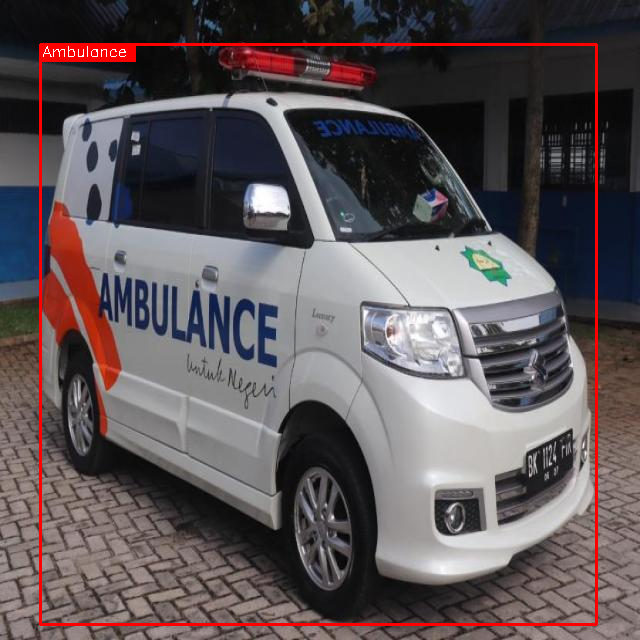

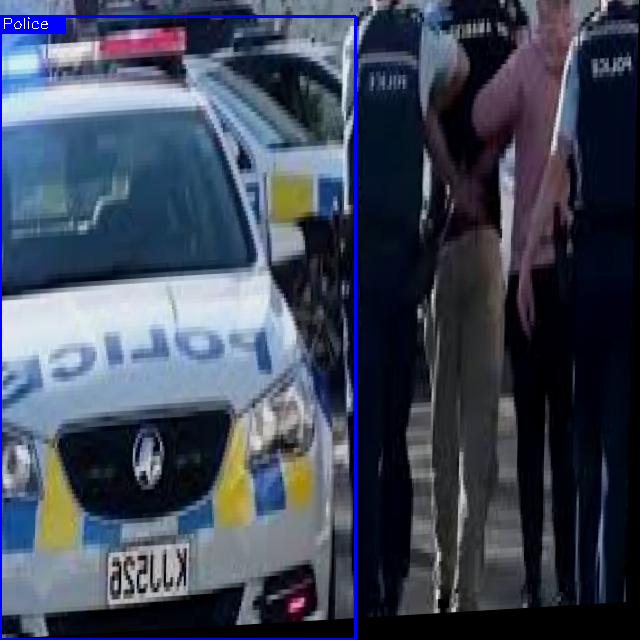

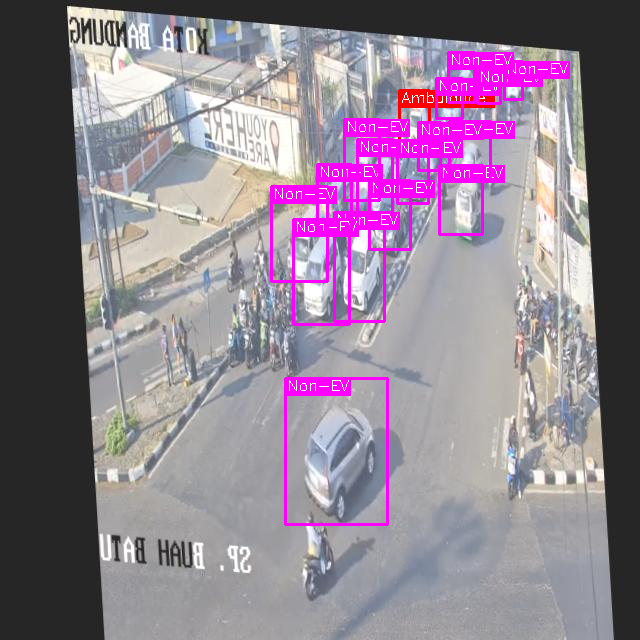

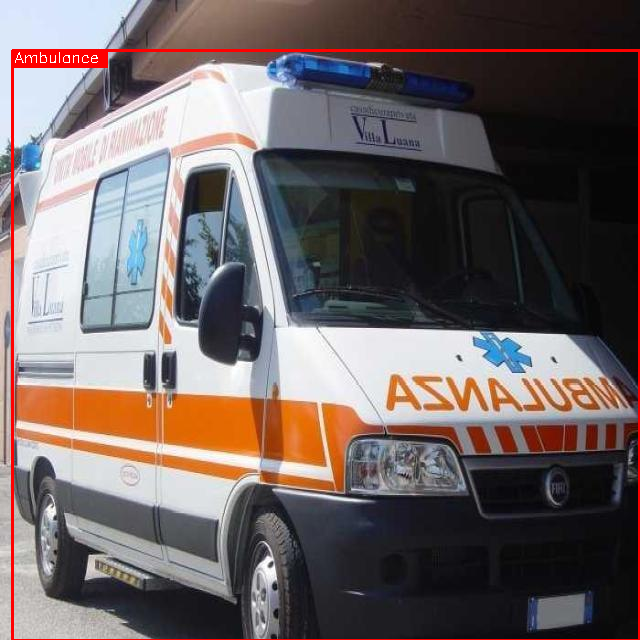

In [ ]:
#@title Samples
samples = [train_set[222], train_set[100], train_set[369], train_set[469]]

for s in samples:
  path, image, annotations = s
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  annotations = {"boxes": annotations.xyxy,
                "labels": annotations.class_id,
                "scores": np.array([-1 for _ in annotations.xyxy])}
  image = paint_bbox(image, annotations, normalize_bbox=False)
  image = Image.fromarray(image)
  display(image)


# Model

In [7]:
from google.colab import drive
from google.colab import files
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [8]:
#@title Setup
# More ref: https://albumentations.ai/docs/integrations/roboflow/train-rt-detr-on-custom-dataset-with-transformers/

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USING_SELF_TRAINED = True

if USING_SELF_TRAINED:
  checkpoint_date = "2024-12-27"
  #load_path = f"/content/gdrive/My Drive/rtdetr/{checkpoint_date}_model-2394"
  load_path = "/content/gdrive/My Drive/rtdetr/241228_checkpoint-342"

  model, load_info = AutoModelForObjectDetection.from_pretrained(
            load_path,
            label2id=label2id,
            id2label=id2label,
            num_labels=4,
            output_loading_info=True)
  model = model.to(DEVICE)
  processor = AutoProcessor.from_pretrained(load_path)

  #train_args = torch.load(f"{load_path}/training_args.bin")
  #trainer_state = TrainerState.load_from_json(f"{load_path}/trainer_state.json")
  # optimizer_state = torch.load(f"{load_path}/optimizer.pt")
  # scheduler_state = torch.load(f"{load_path}/scheduler.pt")
  # rng_state = torch.load(f"{load_path}/rng_state.pth")
  # torch.set_rng_state(rng_state["cpu"])
  # if torch.cuda.is_available():
  #   torch.cuda.set_rng_state(rng_state["cuda"])


  model.class_labels_classifier = torch.nn.Linear(
    in_features = model.config.hidden_size,
    out_features = len(PALETTE))

  # Load custom weights
  weights = load_file(f"{load_path}/model.safetensors")
  model.class_labels_classifier.weight.data = weights["class_labels_classifier.weight"]
  model.class_labels_classifier.bias.data = weights["class_labels_classifier.bias"]
  del weights
else:
  # Load a COCO-pretrained RT-DETR-l mode
  CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
  model = AutoModelForObjectDetection.from_pretrained(
              CHECKPOINT,
              label2id=label2id,
              id2label=id2label,
              ignore_mismatched_sizes=True).to(DEVICE)
  processor = AutoImageProcessor.from_pretrained(CHECKPOINT)

  # Replace final layer
  model.class_labels_classifier = torch.nn.Linear(
      in_features = model.config.hidden_size,
      out_features = len(PALETTE))

model.config.num_labels = len(PALETTE)
model.config.id2label = id2label
model.config.label2id = label2id
#print(model.config)

Some weights of the model checkpoint at /content/gdrive/My Drive/rtdetr/241228_checkpoint-342 were not used when initializing RTDetrForObjectDetection: ['class_labels_classifier.bias', 'class_labels_classifier.weight']
- This IS expected if you are initializing RTDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RTDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow process

In [10]:
#@title Data loader initialization
evnev_train = EVNEVDataset(train_set, processor, None)
evnev_valid = EVNEVDataset(valid_set, processor, None)
evnev_test = EVNEVDataset(test_set, processor, None)

In [ ]:
#@title Layer Freezing

# Let's freeze the backbone since this only captures low level features
for name, param in model.named_parameters():
  if "backbone" in name: param.requires_grad = False

# Inspect trainable stuff here
for name, param in model.named_parameters():
    print(f"{name}: {'trainable' if param.requires_grad else 'frozen'}")

model.backbone.model.embedder.embedder.0.convolution.weight: frozen
model.backbone.model.embedder.embedder.1.convolution.weight: frozen
model.backbone.model.embedder.embedder.2.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.0.shortcut.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.0.layer.0.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.0.layer.1.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.0.layer.2.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.1.layer.0.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.1.layer.1.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.1.layer.2.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.2.layer.0.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.2.layer.1.convolution.weight: frozen
model.backbone.model.encoder.stages.0.layers.2.layer.2.co

In [ ]:
# This tells PyTorch the format it should use when taking a batch
def collate_fn(batch):
  data = {}
  data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
  data["labels"] = [x["labels"] for x in batch]
  return data

# Model Training

In [ ]:
#@title Training Setup
# references: https://huggingface.co/evaluate-metric
#accuracy = evaluate.load("mape")

# For continuing the training, change to (DESIRED_EPOCH - current_epoch). I'm not used to HF framework, so this could do for now
# Stuff like optimizer and scheduler state may not be loaded, but atleast the saved weights are there
EPOCH = 15
BATCH_SIZE = 24
steps_per_epoch = math.ceil(len(train_set) / BATCH_SIZE)
LEARNING_RATE = 5e-5


train_args = TrainingArguments(
    output_dir=f"{dataset.name.replace('', '_')}-transferTest",
    save_strategy="epoch",
    num_train_epochs=EPOCH,
    learning_rate=LEARNING_RATE,
    dataloader_num_workers=2,
    warmup_steps= (200 if not USING_SELF_TRAINED else 0),
    per_device_train_batch_size=BATCH_SIZE, # 16 = ~9.4GB, 24 = ~14.4GB
    per_device_eval_batch_size=BATCH_SIZE, # 16 = ~9.4GB, 24 = ~14.4GB
    report_to="none",
    logging_strategy="steps",
    logging_steps=steps_per_epoch,
    eval_strategy="steps",
    eval_steps=steps_per_epoch)

#print(train_args)
trainer = Trainer(
    model=model,
    args = train_args,
    train_dataset = evnev_train,
    eval_dataset = evnev_valid,
    tokenizer = processor,
    data_collator = collate_fn)

In [ ]:
#@title Training E14-20
trainer.train()

Step,Training Loss,Validation Loss
171,9.576200,8.109590
342,9.411700,7.590062
513,9.227900,7.364055
684,8.996800,7.751129
855,8.805100,7.610054
1026,8.796900,7.724325


TrainOutput(global_step=1026, training_loss=9.135769433213024, metrics={'train_runtime': 2446.597, 'train_samples_per_second': 10.02, 'train_steps_per_second': 0.419, 'total_flos': 7.724407276634112e+18, 'train_loss': 9.135769433213024, 'epoch': 6.0})

In [ ]:
#@title Training E20-22
# Stopped in the middle of training in case of my free credit ran out
# and lose the runtime
trainer.train()

Step,Training Loss,Validation Loss
171,8.906100,7.783415
342,8.687500,7.363750


KeyboardInterrupt: 

In [ ]:
#@title Training E22-32
# Last-ditch training!
trainer.train()

Step,Training Loss,Validation Loss
171,8.530900,7.667809
342,8.270400,7.387921
513,8.057400,7.149913
684,7.897700,7.723245
855,7.761700,7.698280
1026,7.702100,7.524474
1197,7.585200,7.606085
1368,7.442300,7.456039
1539,7.403600,7.714159
1710,7.386500,7.773373


TrainOutput(global_step=1710, training_loss=7.803769616913377, metrics={'train_runtime': 4075.6847, 'train_samples_per_second': 10.025, 'train_steps_per_second': 0.42, 'total_flos': 1.287401212772352e+19, 'train_loss': 7.803769616913377, 'epoch': 10.0})

## Post-Training Stuff
Loggings and visualizations of things obtained during training

In [ ]:
#@title Log: E1-14
# Obtained from self-trained model's log
train_logs_1 = filter(lambda h: "loss" in h, trainer_state.log_history)
eval_logs_1 = filter(lambda h: "eval_loss" in h, trainer_state.log_history)

print("Train log 1")
for l in train_logs_1: print(l)

print("Eval log 1")
for l in eval_logs_1: print(l)

Train log 1
{'epoch': 1.0, 'grad_norm': 39.28269958496094, 'learning_rate': 4.275e-05, 'loss': 90.899, 'step': 171}
{'epoch': 2.0, 'grad_norm': 22.982336044311523, 'learning_rate': 4.720031545741325e-05, 'loss': 14.4117, 'step': 342}
{'epoch': 3.0, 'grad_norm': 80.04906463623047, 'learning_rate': 4.382886435331231e-05, 'loss': 12.6404, 'step': 513}
{'epoch': 4.0, 'grad_norm': 39.963130950927734, 'learning_rate': 4.0457413249211356e-05, 'loss': 11.7974, 'step': 684}
{'epoch': 5.0, 'grad_norm': 118.22100830078125, 'learning_rate': 3.708596214511041e-05, 'loss': 11.2072, 'step': 855}
{'epoch': 6.0, 'grad_norm': 46.68867111206055, 'learning_rate': 3.371451104100947e-05, 'loss': 10.8029, 'step': 1026}
{'epoch': 7.0, 'grad_norm': 47.71335983276367, 'learning_rate': 3.034305993690852e-05, 'loss': 10.4905, 'step': 1197}
{'epoch': 8.0, 'grad_norm': 50.18522262573242, 'learning_rate': 2.697160883280757e-05, 'loss': 10.1508, 'step': 1368}
{'epoch': 9.0, 'grad_norm': 119.29390716552734, 'learning_

In [ ]:
#@title Log: E15-20
for p in trainer.state.log_history:
  print(p)

{'loss': 9.5762, 'grad_norm': 56.257755279541016, 'learning_rate': 4.166666666666667e-05, 'epoch': 1.0, 'step': 171}
{'eval_loss': 8.109589576721191, 'eval_runtime': 11.3557, 'eval_samples_per_second': 16.644, 'eval_steps_per_second': 0.704, 'epoch': 1.0, 'step': 171}
{'loss': 9.4117, 'grad_norm': 24.137285232543945, 'learning_rate': 3.3333333333333335e-05, 'epoch': 2.0, 'step': 342}
{'eval_loss': 7.590062141418457, 'eval_runtime': 11.2158, 'eval_samples_per_second': 16.851, 'eval_steps_per_second': 0.713, 'epoch': 2.0, 'step': 342}
{'loss': 9.2279, 'grad_norm': 33.61099624633789, 'learning_rate': 2.5e-05, 'epoch': 3.0, 'step': 513}
{'eval_loss': 7.364055156707764, 'eval_runtime': 11.3901, 'eval_samples_per_second': 16.593, 'eval_steps_per_second': 0.702, 'epoch': 3.0, 'step': 513}
{'loss': 8.9968, 'grad_norm': 212.6320343017578, 'learning_rate': 1.6666666666666667e-05, 'epoch': 4.0, 'step': 684}
{'eval_loss': 7.751129150390625, 'eval_runtime': 11.1549, 'eval_samples_per_second': 16.94

In [ ]:
#@title Log:E21-22
# Obtained from loading the final model. The weight from previous training was preserved, but the history wasn't (I don't familiar how to set things in this framework)
train_logs_2 = filter(lambda h: "loss" in h, trainer_state.log_history)
eval_logs_2 = filter(lambda h: "eval_loss" in h, trainer_state.log_history)

print("Train log 2")
for l in train_logs_2: print(l)

print("Eval log 2")
for l in eval_logs_2: print(l)

Train log 2
{'epoch': 1.0, 'grad_norm': 34.20478820800781, 'learning_rate': 4.166666666666667e-05, 'loss': 8.9061, 'step': 171}
{'epoch': 2.0, 'grad_norm': 20.21470069885254, 'learning_rate': 3.3333333333333335e-05, 'loss': 8.6875, 'step': 342}
Eval log 2
{'epoch': 1.0, 'eval_loss': 7.783414840698242, 'eval_runtime': 11.1023, 'eval_samples_per_second': 17.023, 'eval_steps_per_second': 0.721, 'step': 171}
{'epoch': 2.0, 'eval_loss': 7.363749980926514, 'eval_runtime': 11.3476, 'eval_samples_per_second': 16.656, 'eval_steps_per_second': 0.705, 'step': 342}


In [ ]:
#@title Log:E23-32
# Obtained from loading the final model. The weight from previous training was preserved, but the history wasn't (I don't familiar how to set things in this framework)
train_logs_3 = filter(lambda h: "loss" in h, trainer_state.log_history)
eval_logs_3 = filter(lambda h: "eval_loss" in h, trainer_state.log_history)

print("Train log 3")
for l in train_logs_3: print(l)

print("Eval log 3")
for l in eval_logs_3: print(l)

Train log 3
{'epoch': 1.0, 'grad_norm': 19.82036018371582, 'learning_rate': 4.5e-05, 'loss': 8.5309, 'step': 171}
{'epoch': 2.0, 'grad_norm': 25.443775177001953, 'learning_rate': 4e-05, 'loss': 8.2704, 'step': 342}
{'epoch': 3.0, 'grad_norm': 26.668907165527344, 'learning_rate': 3.5e-05, 'loss': 8.0574, 'step': 513}
{'epoch': 4.0, 'grad_norm': 170.76553344726562, 'learning_rate': 3e-05, 'loss': 7.8977, 'step': 684}
{'epoch': 5.0, 'grad_norm': 45.304710388183594, 'learning_rate': 2.5e-05, 'loss': 7.7617, 'step': 855}
{'epoch': 6.0, 'grad_norm': 27.8206787109375, 'learning_rate': 2e-05, 'loss': 7.7021, 'step': 1026}
{'epoch': 7.0, 'grad_norm': 31.737234115600586, 'learning_rate': 1.5e-05, 'loss': 7.5852, 'step': 1197}
{'epoch': 8.0, 'grad_norm': 37.47389221191406, 'learning_rate': 1e-05, 'loss': 7.4423, 'step': 1368}
{'epoch': 9.0, 'grad_norm': 26.01499366760254, 'learning_rate': 5e-06, 'loss': 7.4036, 'step': 1539}
{'epoch': 10.0, 'grad_norm': 34.116275787353516, 'learning_rate': 0.0, '

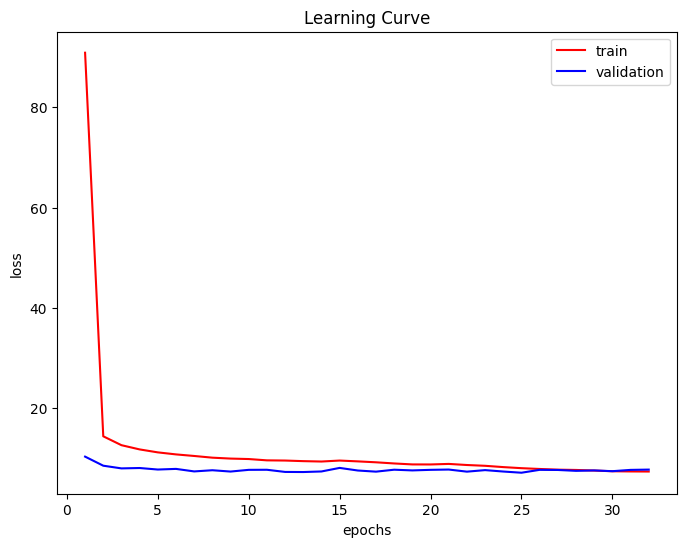

In [ ]:
#@title Error Plotting
# If `report_to` oprtion is setted other than "none",
# plotting manually here is unnecessary

# The value used here is extracted from the training log we got
TRAIN_HISTORY = [
  {'epoch': 1.0, 'grad_norm': 39.28269958496094, 'learning_rate': 4.275e-05, 'loss': 90.899, 'step': 171},
  {'epoch': 2.0, 'grad_norm': 22.982336044311523, 'learning_rate': 4.720031545741325e-05, 'loss': 14.4117, 'step': 342},
  {'epoch': 3.0, 'grad_norm': 80.04906463623047, 'learning_rate': 4.382886435331231e-05, 'loss': 12.6404, 'step': 513},
  {'epoch': 4.0, 'grad_norm': 39.963130950927734, 'learning_rate': 4.0457413249211356e-05, 'loss': 11.7974, 'step': 684},
  {'epoch': 5.0, 'grad_norm': 118.22100830078125, 'learning_rate': 3.708596214511041e-05, 'loss': 11.2072, 'step': 855},
  {'epoch': 6.0, 'grad_norm': 46.68867111206055, 'learning_rate': 3.371451104100947e-05, 'loss': 10.8029, 'step': 1026},
  {'epoch': 7.0, 'grad_norm': 47.71335983276367, 'learning_rate': 3.034305993690852e-05, 'loss': 10.4905, 'step': 1197},
  {'epoch': 8.0, 'grad_norm': 50.18522262573242, 'learning_rate': 2.697160883280757e-05, 'loss': 10.1508, 'step': 1368},
  {'epoch': 9.0, 'grad_norm': 119.29390716552734, 'learning_rate': 2.3600157728706626e-05, 'loss': 9.97, 'step': 1539},
  {'epoch': 10.0, 'grad_norm': 214.00062561035156, 'learning_rate': 2.0228706624605678e-05, 'loss': 9.8779, 'step': 1710},
  {'epoch': 11.0, 'grad_norm': 36.80511474609375, 'learning_rate': 1.6857255520504733e-05, 'loss': 9.6173, 'step': 1881},
  {'epoch': 12.0, 'grad_norm': 132.37144470214844, 'learning_rate': 1.3485804416403785e-05, 'loss': 9.5783, 'step': 2052},
  {'epoch': 13.0, 'grad_norm': 30.56537437438965, 'learning_rate': 1.0114353312302839e-05, 'loss': 9.4595, 'step': 2223},
  {'epoch': 14.0, 'grad_norm': 35.32502746582031, 'learning_rate': 6.742902208201893e-06, 'loss': 9.3814, 'step': 2394},
  {'loss': 9.5762, 'grad_norm': 56.257755279541016, 'learning_rate': 4.166666666666667e-05, 'epoch': 15.0, 'step': 171},
  {'loss': 9.4117, 'grad_norm': 24.137285232543945, 'learning_rate': 3.3333333333333335e-05, 'epoch': 16.0, 'step': 342},
  {'loss': 9.2279, 'grad_norm': 33.61099624633789, 'learning_rate': 2.5e-05, 'epoch': 17.0, 'step': 513},
  {'loss': 8.9968, 'grad_norm': 212.6320343017578, 'learning_rate': 1.6666666666666667e-05, 'epoch': 18.0, 'step': 684},
  {'loss': 8.8051, 'grad_norm': 29.413982391357422, 'learning_rate': 8.333333333333334e-06, 'epoch': 19.0, 'step': 855},
  {'loss': 8.7969, 'grad_norm': 49.25459671020508, 'learning_rate': 0.0, 'epoch': 20.0, 'step': 1026},
  {'epoch': 21.0, 'grad_norm': 34.20478820800781, 'learning_rate': 4.166666666666667e-05, 'loss': 8.9061, 'step': 171},
  {'epoch': 22.0, 'grad_norm': 20.21470069885254, 'learning_rate': 3.3333333333333335e-05, 'loss': 8.6875, 'step': 342},
  {'epoch': 23.0, 'grad_norm': 19.82036018371582, 'learning_rate': 4.5e-05, 'loss': 8.5309, 'step': 171},
  {'epoch': 24.0, 'grad_norm': 25.443775177001953, 'learning_rate': 4e-05, 'loss': 8.2704, 'step': 342},
  {'epoch': 25.0, 'grad_norm': 26.668907165527344, 'learning_rate': 3.5e-05, 'loss': 8.0574, 'step': 513},
  {'epoch': 26.0, 'grad_norm': 170.76553344726562, 'learning_rate': 3e-05, 'loss': 7.8977, 'step': 684},
  {'epoch': 27.0, 'grad_norm': 45.304710388183594, 'learning_rate': 2.5e-05, 'loss': 7.7617, 'step': 855},
  {'epoch': 28.0, 'grad_norm': 27.8206787109375, 'learning_rate': 2e-05, 'loss': 7.7021, 'step': 1026},
  {'epoch': 29.0, 'grad_norm': 31.737234115600586, 'learning_rate': 1.5e-05, 'loss': 7.5852, 'step': 1197},
  {'epoch': 30.0, 'grad_norm': 37.47389221191406, 'learning_rate': 1e-05, 'loss': 7.4423, 'step': 1368},
  {'epoch': 31.0, 'grad_norm': 26.01499366760254, 'learning_rate': 5e-06, 'loss': 7.4036, 'step': 1539},
  {'epoch': 32.0, 'grad_norm': 34.116275787353516, 'learning_rate': 0.0, 'loss': 7.3865, 'step': 1710},
]
VALID_HISTORY = [
  {'epoch': 1.0, 'eval_loss': 10.360262870788574, 'eval_runtime': 11.1174, 'eval_samples_per_second': 17.0, 'eval_steps_per_second': 0.72, 'step': 171},
  {'epoch': 2.0, 'eval_loss': 8.54995059967041, 'eval_runtime': 11.2007, 'eval_samples_per_second': 16.874, 'eval_steps_per_second': 0.714, 'step': 342},
  {'epoch': 3.0, 'eval_loss': 8.013785362243652, 'eval_runtime': 11.1279, 'eval_samples_per_second': 16.984, 'eval_steps_per_second': 0.719, 'step': 513},
  {'epoch': 4.0, 'eval_loss': 8.088844299316406, 'eval_runtime': 11.1493, 'eval_samples_per_second': 16.952, 'eval_steps_per_second': 0.718, 'step': 684},
  {'epoch': 5.0, 'eval_loss': 7.785946846008301, 'eval_runtime': 11.2187, 'eval_samples_per_second': 16.847, 'eval_steps_per_second': 0.713, 'step': 855},
  {'epoch': 6.0, 'eval_loss': 7.912724018096924, 'eval_runtime': 11.0323, 'eval_samples_per_second': 17.131, 'eval_steps_per_second': 0.725, 'step': 1026},
  {'epoch': 7.0, 'eval_loss': 7.40980863571167, 'eval_runtime': 11.1425, 'eval_samples_per_second': 16.962, 'eval_steps_per_second': 0.718, 'step': 1197},
  {'epoch': 8.0, 'eval_loss': 7.644674777984619, 'eval_runtime': 12.3087, 'eval_samples_per_second': 15.355, 'eval_steps_per_second': 0.65, 'step': 1368},
  {'epoch': 9.0, 'eval_loss': 7.382885456085205, 'eval_runtime': 11.1725, 'eval_samples_per_second': 16.917, 'eval_steps_per_second': 0.716, 'step': 1539},
  {'epoch': 10.0, 'eval_loss': 7.723555088043213, 'eval_runtime': 11.1959, 'eval_samples_per_second': 16.881, 'eval_steps_per_second': 0.715, 'step': 1710},
  {'epoch': 11.0, 'eval_loss': 7.7393574714660645, 'eval_runtime': 11.1367, 'eval_samples_per_second': 16.971, 'eval_steps_per_second': 0.718, 'step': 1881},
  {'epoch': 12.0, 'eval_loss': 7.30844259262085, 'eval_runtime': 11.0977, 'eval_samples_per_second': 17.031, 'eval_steps_per_second': 0.721, 'step': 2052},
  {'epoch': 13.0, 'eval_loss': 7.2876482009887695, 'eval_runtime': 12.813, 'eval_samples_per_second': 14.751, 'eval_steps_per_second': 0.624, 'step': 2223},
  {'epoch': 14.0, 'eval_loss': 7.400381565093994, 'eval_runtime': 12.1175, 'eval_samples_per_second': 15.597, 'eval_steps_per_second': 0.66, 'step': 2394},
  {'eval_loss': 8.109589576721191, 'eval_runtime': 11.3557, 'eval_samples_per_second': 16.644, 'eval_steps_per_second': 0.704, 'epoch': 15.0, 'step': 171},
  {'eval_loss': 7.590062141418457, 'eval_runtime': 11.2158, 'eval_samples_per_second': 16.851, 'eval_steps_per_second': 0.713, 'epoch': 16.0, 'step': 342},
  {'eval_loss': 7.364055156707764, 'eval_runtime': 11.3901, 'eval_samples_per_second': 16.593, 'eval_steps_per_second': 0.702, 'epoch': 17.0, 'step': 513},
  {'eval_loss': 7.751129150390625, 'eval_runtime': 11.1549, 'eval_samples_per_second': 16.943, 'eval_steps_per_second': 0.717, 'epoch': 18.0, 'step': 684},
  {'eval_loss': 7.6100544929504395, 'eval_runtime': 11.0398, 'eval_samples_per_second': 17.12, 'eval_steps_per_second': 0.725, 'epoch': 19.0, 'step': 855},
  {'eval_loss': 7.724325180053711, 'eval_runtime': 12.5504, 'eval_samples_per_second': 15.059, 'eval_steps_per_second': 0.637, 'epoch': 20.0, 'step': 1026},
  {'epoch': 21.0, 'eval_loss': 7.783414840698242, 'eval_runtime': 11.1023, 'eval_samples_per_second': 17.023, 'eval_steps_per_second': 0.721, 'step': 171},
  {'epoch': 22.0, 'eval_loss': 7.363749980926514, 'eval_runtime': 11.3476, 'eval_samples_per_second': 16.656, 'eval_steps_per_second': 0.705, 'step': 342},
  {'epoch': 23.0, 'eval_loss': 7.667809009552002, 'eval_runtime': 11.0699, 'eval_samples_per_second': 17.073, 'eval_steps_per_second': 0.723, 'step': 171},
  {'epoch': 24.0, 'eval_loss': 7.38792085647583, 'eval_runtime': 11.1677, 'eval_samples_per_second': 16.924, 'eval_steps_per_second': 0.716, 'step': 342},
  {'epoch': 25.0, 'eval_loss': 7.1499128341674805, 'eval_runtime': 11.1311, 'eval_samples_per_second': 16.979, 'eval_steps_per_second': 0.719, 'step': 513},
  {'epoch': 26.0, 'eval_loss': 7.723244667053223, 'eval_runtime': 11.4568, 'eval_samples_per_second': 16.497, 'eval_steps_per_second': 0.698, 'step': 684},
  {'epoch': 27.0, 'eval_loss': 7.698280334472656, 'eval_runtime': 11.359, 'eval_samples_per_second': 16.639, 'eval_steps_per_second': 0.704, 'step': 855},
  {'epoch': 28.0, 'eval_loss': 7.524473667144775, 'eval_runtime': 11.0361, 'eval_samples_per_second': 17.126, 'eval_steps_per_second': 0.725, 'step': 1026},
  {'epoch': 29.0, 'eval_loss': 7.606084823608398, 'eval_runtime': 11.1948, 'eval_samples_per_second': 16.883, 'eval_steps_per_second': 0.715, 'step': 1197},
  {'epoch': 30.0, 'eval_loss': 7.456038951873779, 'eval_runtime': 11.4545, 'eval_samples_per_second': 16.5, 'eval_steps_per_second': 0.698, 'step': 1368},
  {'epoch': 31.0, 'eval_loss': 7.71415901184082, 'eval_runtime': 11.4769, 'eval_samples_per_second': 16.468, 'eval_steps_per_second': 0.697, 'step': 1539},
  {'epoch': 32.0, 'eval_loss': 7.773373126983643, 'eval_runtime': 11.1065, 'eval_samples_per_second': 17.017, 'eval_steps_per_second': 0.72, 'step': 1710},
]

TRAIN_LOSS = [h["loss"] for h in TRAIN_HISTORY]
VALID_LOSS = [h["eval_loss"] for h in VALID_HISTORY]

epochs = range(1, len(TRAIN_LOSS) + 1)
plt.figure(figsize=(8, 6))
plt.plot(epochs, TRAIN_LOSS, 'r', label="train")
plt.plot(epochs, VALID_LOSS, 'b', label="validation")
plt.title(f"Learning Curve")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

In [ ]:
#@title (Ignore)

# If `report_to` oprtion is setted other than "none",
# plotting manually here is unnecessary
history = trainer.state.log_history[:-1]
TRAIN_HISTORY = [h["loss"] for h in history if 'loss' in h]
VALID_HISTORY = [h["eval_loss"] for h in history if 'eval_loss' in h]

epochs = range(1, len(TRAIN_HISTORY) + 1)
plt.figure(figsize=(8, 6))
plt.plot(epochs, TRAIN_HISTORY, 'r', label="train")
plt.plot(epochs, VALID_HISTORY, 'b', label="validation")
plt.title(f"Learning Curve")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

for h in trainer.state.log_history:
  print(h)

{'loss': 39.2061, 'grad_norm': 29.145832061767578, 'learning_rate': 9.730652503793627e-05, 'epoch': 1.0, 'step': 171}
{'loss': 12.8452, 'grad_norm': 27.674257278442383, 'learning_rate': 9.081942336874052e-05, 'epoch': 2.0, 'step': 342}
{'loss': 11.1438, 'grad_norm': 150.23606872558594, 'learning_rate': 8.433232169954477e-05, 'epoch': 3.0, 'step': 513}
{'loss': 10.533, 'grad_norm': 328.7481994628906, 'learning_rate': 7.784522003034901e-05, 'epoch': 4.0, 'step': 684}
{'loss': 9.8831, 'grad_norm': 24.630233764648438, 'learning_rate': 7.135811836115327e-05, 'epoch': 5.0, 'step': 855}
{'loss': 9.4962, 'grad_norm': 81.63553619384766, 'learning_rate': 6.48710166919575e-05, 'epoch': 6.0, 'step': 1026}
{'loss': 9.3714, 'grad_norm': 29.965877532958984, 'learning_rate': 5.838391502276176e-05, 'epoch': 7.0, 'step': 1197}
{'loss': 9.0055, 'grad_norm': 72.48068237304688, 'learning_rate': 5.189681335356601e-05, 'epoch': 8.0, 'step': 1368}
{'loss': 8.9922, 'grad_norm': 234.26515197753906, 'learning_ra

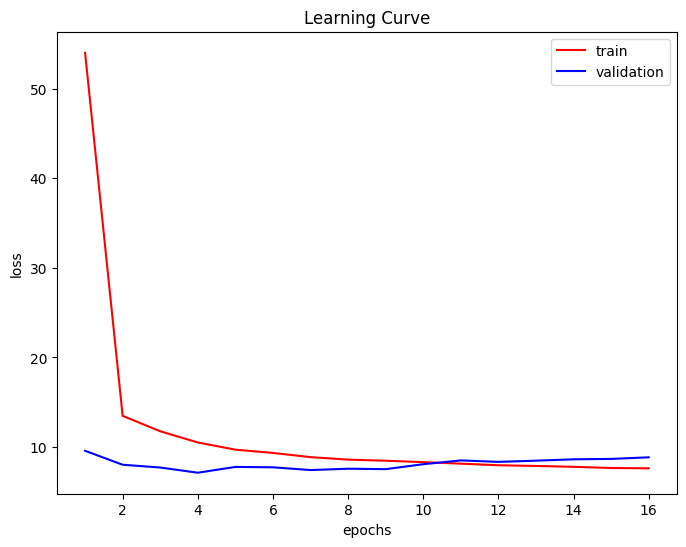

{'loss': 54.0075, 'grad_norm': 73.4098892211914, 'learning_rate': 9.730652503793627e-05, 'epoch': 1.0, 'step': 171}
{'eval_loss': 9.580719947814941, 'eval_runtime': 11.2607, 'eval_samples_per_second': 16.784, 'eval_steps_per_second': 0.71, 'epoch': 1.0, 'step': 171}
{'loss': 13.4788, 'grad_norm': 21.221683502197266, 'learning_rate': 9.081942336874052e-05, 'epoch': 2.0, 'step': 342}
{'eval_loss': 8.022984504699707, 'eval_runtime': 12.4143, 'eval_samples_per_second': 15.224, 'eval_steps_per_second': 0.644, 'epoch': 2.0, 'step': 342}
{'loss': 11.759, 'grad_norm': 60.57970428466797, 'learning_rate': 8.433232169954477e-05, 'epoch': 3.0, 'step': 513}
{'eval_loss': 7.7122273445129395, 'eval_runtime': 11.5065, 'eval_samples_per_second': 16.425, 'eval_steps_per_second': 0.695, 'epoch': 3.0, 'step': 513}
{'loss': 10.5105, 'grad_norm': 89.66680145263672, 'learning_rate': 7.784522003034901e-05, 'epoch': 4.0, 'step': 684}
{'eval_loss': 7.132922172546387, 'eval_runtime': 13.5991, 'eval_samples_per_s

In [ ]:
#@title (Also ignore this)
# If `report_to` oprtion is setted other than "none",
# plotting manually here is unnecessary
history = trainer.state.log_history[:-1]
TRAIN_HISTORY = [h["loss"] for h in history if 'loss' in h]
VALID_HISTORY = [h["eval_loss"] for h in history if 'eval_loss' in h]

epochs = range(1, len(TRAIN_HISTORY) + 1)
plt.figure(figsize=(8, 6))
plt.plot(epochs, TRAIN_HISTORY, 'r', label="train")
plt.plot(epochs, VALID_HISTORY, 'b', label="validation")
plt.title(f"Learning Curve")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

for h in trainer.state.log_history:
  print(h)

# Evaluation
We experimented with many models. Among them, the final model to be used is **M_24-12-28**

======== FORMAT =========
Ground Truth | Prediction


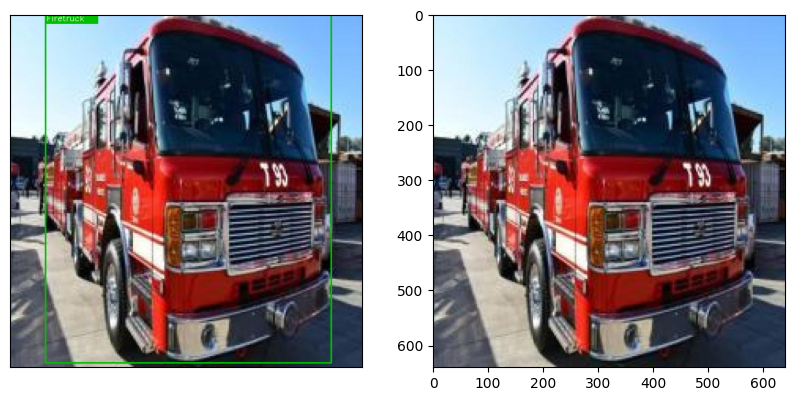

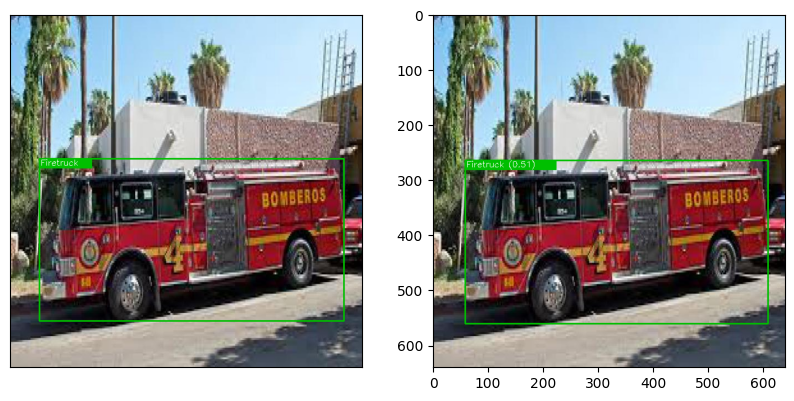

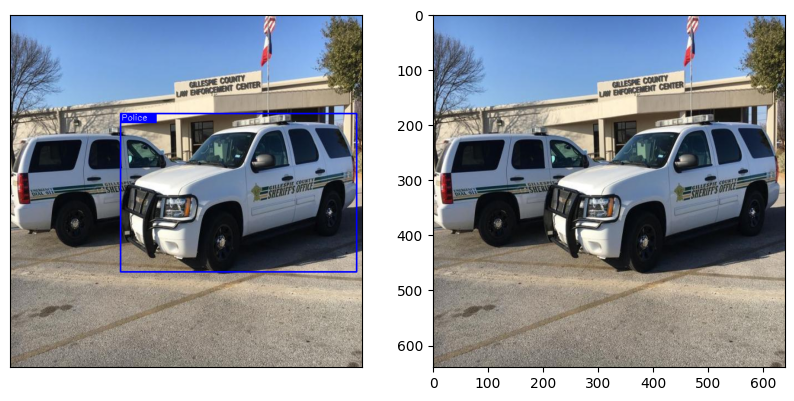

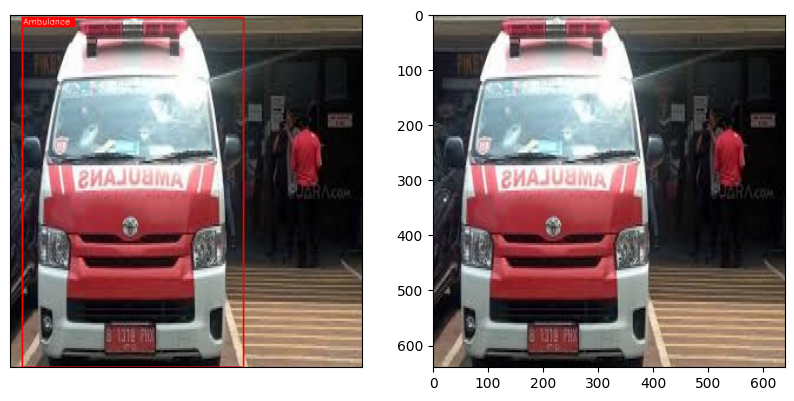

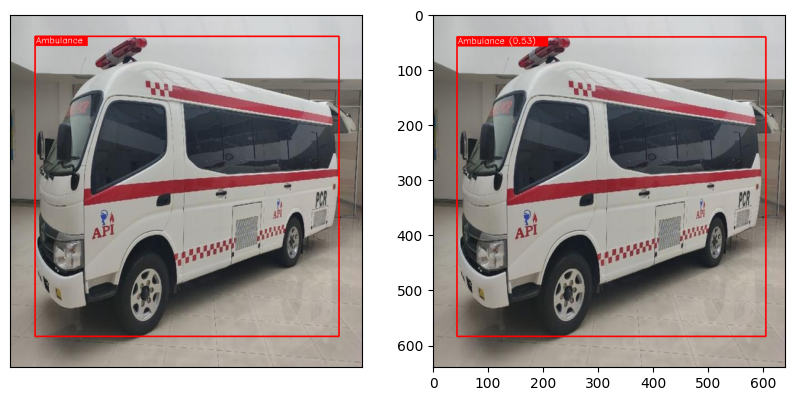

...

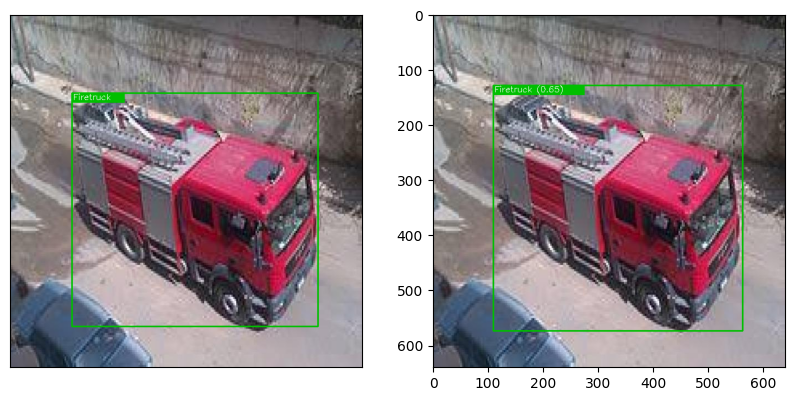

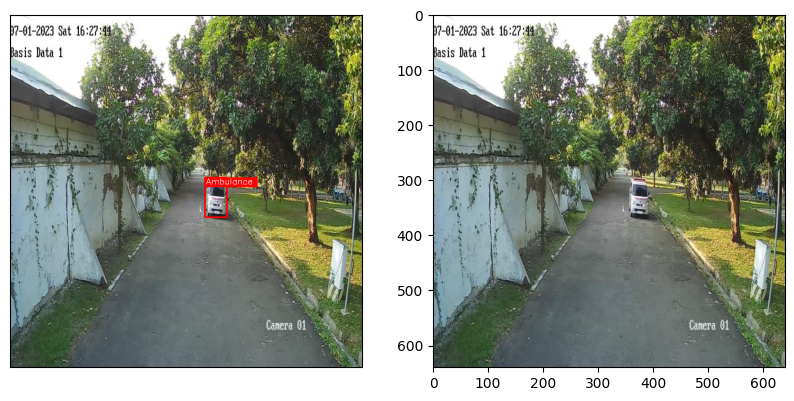

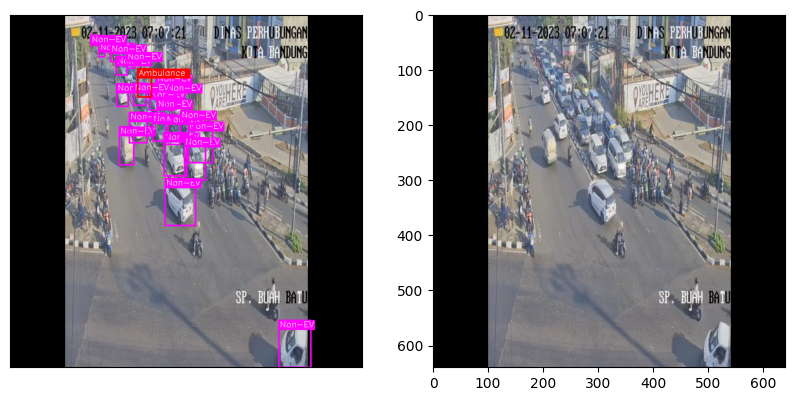

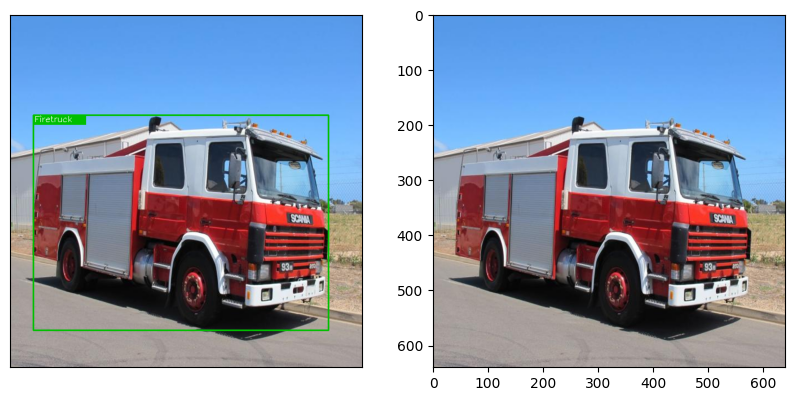

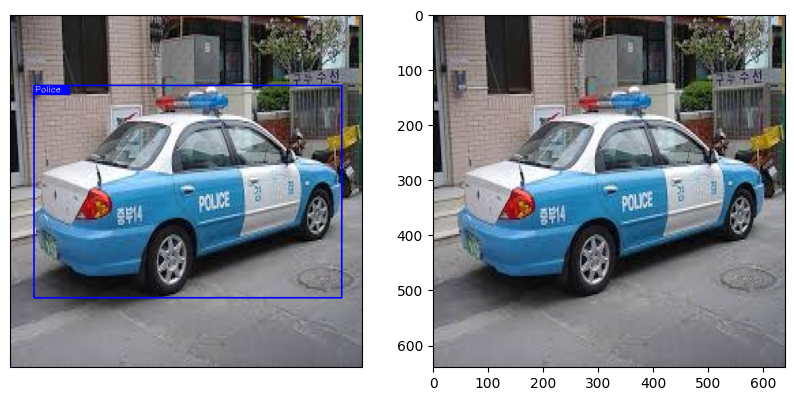

In [14]:
#@title Visualization and metric computation
map_metric = MeanAveragePrecision(iou_thresholds=[0.5, 0.75],
                                  iou_type="bbox",
                                  class_metrics=True)
iou_metric50 = IntersectionOverUnion(iou_threshold=0.5,
                                  class_metrics=True,
                                   respect_labels=True)
iou_metric75 = IntersectionOverUnion(iou_threshold=0.75,
                                     class_metrics=True,
                                     respect_labels=True)
print("======== FORMAT =========")
print("Ground Truth | Prediction")
DISPLAY_INTERVAL = 1
DISPLAY_LIMIT = 50 #128
USED_TEST_LENGTH = len(evnev_test)
i_display = 0
for t in evnev_test:
    image = t["pixel_values"]
    label = t["labels"]
    label["boxes"] = np.array([
        unnormalize_bbox(label["size"][0], label["size"][1], b)
        for b in label["boxes"]
    ])

    # Me found an edge case. This may be because of a minor error on data side.
    # There's an image without a notation in the dataset. It was the one with a police
    # car at (I think) night scenary. We're gonna skip that for now and won't be considered
    # for performance evaluation
    if len(label["boxes"]) == 0:
      USED_TEST_LENGTH -= 1
      continue

    w, h = image.shape[1], image.shape[2]
    inputs = processor(images=image,
                       return_tensors="pt",
                       do_rescale=False).to(DEVICE)
    outputs = model(**inputs)
    results = processor.post_process_object_detection(
        outputs=outputs,
        threshold=0.0, # Disable it for now
        target_sizes=[(h, w)])
    detections = sv.Detections.from_transformers(results[0])

    post_processed_results = processor.post_process_object_detection(
        outputs=outputs,
        threshold=0.5,
        target_sizes=[(h, w)])
    post_processed_detections = sv.Detections.from_transformers(post_processed_results[0])
    pred = {"boxes": post_processed_detections.xyxy,
          "labels": post_processed_detections.class_id,
          "scores": post_processed_detections.confidence}
    truth = {"boxes": label["boxes"],
           "labels": label["class_labels"],
           "scores": np.array([-1 for _ in label["boxes"]])}
    display_image = (image.numpy()*255).transpose(1, 2, 0).astype(np.uint8)
    truth_image = paint_bbox(display_image,
                            truth,
                            normalize_labels=False,
                            normalize_bbox=False)
    pred_image = paint_bbox(display_image,
                            pred,
                            normalize_labels=False,
                            normalize_bbox=False)

    # Prepare predictions and ground truths
    formatted_prediction = [{
        "boxes": torch.tensor(detections.xyxy),
        "labels": torch.tensor(detections.class_id),
        "scores": torch.tensor(detections.confidence)
    }]
    formatted_truth = [{
        "boxes": torch.tensor(label["boxes"]),
        "labels": torch.tensor(label["class_labels"])
    }]

    # Update metrics
    map_metric.update(formatted_prediction, formatted_truth)
    iou_metric50.update(formatted_prediction, formatted_truth)
    iou_metric75.update(formatted_prediction, formatted_truth)

    # Show it!
    i_display += 1
    if i_display % DISPLAY_INTERVAL == 0 and DISPLAY_LIMIT > 0:
        truth_image = Image.fromarray(truth_image)
        pred_image = Image.fromarray(pred_image)
        columns = 2
        fig, ax = plt.subplots(1, columns, figsize=(10, 20))
        for i in range(columns):
            ax[i].xaxis.set_visible(False)
            ax[i].yaxis.set_visible(False)
            ax[0].imshow(truth_image)
            ax[1].imshow(pred_image)
            plt.show()

    if DISPLAY_LIMIT > 0:
        DISPLAY_LIMIT -= 1

In [ ]:
#@title Perf: M_24-12-24
# Model from: 24 Dec (The one with no validation loss record. The first gen!)
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.2357)
map_50 tensor(0.2374)
map_75 tensor(0.2340)
map_small tensor(0.0124)
map_medium tensor(0.3572)
map_large tensor(0.2640)
mar_1 tensor(0.2415)
mar_10 tensor(0.2474)
mar_100 tensor(0.2474)
mar_small tensor(0.0109)
mar_medium tensor(0.3884)
mar_large tensor(0.2744)
map_per_class tensor([0.3507, 0.3178, 0.1867, 0.0877])
mar_100_per_class tensor([0.3704, 0.3263, 0.1923, 0.1006])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.2644), 'iou/cl_0': tensor(0.3787), 'iou/cl_1': tensor(0.3248), 'iou/cl_2': tensor(0.2075), 'iou/cl_3': tensor(0.1618)}
IoU threshold confidence = 0.75
{'iou': tensor(0.2618), 'iou/cl_0': tensor(0.3787), 'iou/cl_1': tensor(0.3248), 'iou/cl_2': tensor(0.2075), 'iou/cl_3': tensor(0.1512)}


In [ ]:
#@title Perf:M_24-12-26
# Model from: 26 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
computed_iou = iou_metric.compute()
print(computed_iou)

====== Boilerplates ======
map tensor(0.4398)
map_50 tensor(0.4531)
map_75 tensor(0.4265)
map_small tensor(0.0124)
map_medium tensor(0.2319)
map_large tensor(0.5405)
mar_1 tensor(0.4095)
mar_10 tensor(0.4521)
mar_100 tensor(0.4521)
mar_small tensor(0.0109)
mar_medium tensor(0.2502)
mar_large tensor(0.5578)
map_per_class tensor([0.6495, 0.6652, 0.1683, 0.2762])
mar_100_per_class tensor([0.6543, 0.6737, 0.1667, 0.3136])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
{'iou': tensor(0.2530), 'iou/cl_0': tensor(0.6898), 'iou/cl_1': tensor(0.6536), 'iou/cl_2': tensor(0.1658), 'iou/cl_3': tensor(0.1153)}


In [19]:
#@title Perf: M_24-12-28 (No post-processing thresholding)
# Model from: 28 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.7497)
map_50 tensor(0.7764)
map_75 tensor(0.7230)
map_small tensor(0.2697)
map_medium tensor(0.5595)
map_large tensor(0.8446)
mar_1 tensor(0.7186)
mar_10 tensor(0.9125)
mar_100 tensor(0.9476)
mar_small tensor(0.6141)
mar_medium tensor(0.8679)
mar_large tensor(0.9918)
map_per_class tensor([0.8337, 0.7067, 0.8943, 0.5642])
mar_100_per_class tensor([0.9815, 0.9895, 1.0000, 0.8195])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.7814), 'iou/cl_0': tensor(0.7526), 'iou/cl_1': tensor(0.8422), 'iou/cl_2': tensor(0.7990), 'iou/cl_3': tensor(0.7845)}
IoU threshold confidence = 0.75
{'iou': tensor(0.8866), 'iou/cl_0': tensor(0.8714), 'iou/cl_1': tensor(0.9265), 'iou/cl_2': tensor(0.8981), 'iou/cl_3': tensor(0.8663)}


In [ ]:
#@title Perf: M_24-12-28
# Model from: 28 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.4160)
map_50 tensor(0.4189)
map_75 tensor(0.4131)
map_small tensor(0.)
map_medium tensor(0.1277)
map_large tensor(0.4782)
mar_1 tensor(0.4195)
mar_10 tensor(0.4274)
mar_100 tensor(0.4274)
mar_small tensor(0.)
mar_medium tensor(0.1334)
mar_large tensor(0.4910)
map_per_class tensor([0.6018, 0.3478, 0.6198, 0.0946])
mar_100_per_class tensor([0.6235, 0.3632, 0.6282, 0.0947])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.4430), 'iou/cl_0': tensor(0.6523), 'iou/cl_1': tensor(0.3694), 'iou/cl_2': tensor(0.6640), 'iou/cl_3': tensor(0.1628)}
IoU threshold confidence = 0.75
{'iou': tensor(0.4417), 'iou/cl_0': tensor(0.6517), 'iou/cl_1': tensor(0.3667), 'iou/cl_2': tensor(0.6640), 'iou/cl_3': tensor(0.1628)}


In [26]:
#@title Perf: M_24-12-30 (No post-processing thresholding)
# Model from: 30 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.7336)
map_50 tensor(0.7584)
map_75 tensor(0.7088)
map_small tensor(0.3234)
map_medium tensor(0.4489)
map_large tensor(0.8299)
mar_1 tensor(0.7188)
mar_10 tensor(0.9045)
mar_100 tensor(0.9484)
mar_small tensor(0.6359)
mar_medium tensor(0.8857)
mar_large tensor(0.9890)
map_per_class tensor([0.7894, 0.7385, 0.8505, 0.5560])
mar_100_per_class tensor([0.9877, 0.9895, 1.0000, 0.8166])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.7691), 'iou/cl_0': tensor(0.7697), 'iou/cl_1': tensor(0.7694), 'iou/cl_2': tensor(0.7765), 'iou/cl_3': tensor(0.7591)}
IoU threshold confidence = 0.75
{'iou': tensor(0.8703), 'iou/cl_0': tensor(0.8705), 'iou/cl_1': tensor(0.8786), 'iou/cl_2': tensor(0.8809), 'iou/cl_3': tensor(0.8487)}


In [ ]:
#@title Perf: M_24-12-30
# Model from: 30 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.3672)
map_50 tensor(0.3686)
map_75 tensor(0.3658)
map_small tensor(0.)
map_medium tensor(0.1062)
map_large tensor(0.4025)
mar_1 tensor(0.3574)
mar_10 tensor(0.3762)
mar_100 tensor(0.3762)
mar_small tensor(0.)
mar_medium tensor(0.1069)
mar_large tensor(0.4112)
map_per_class tensor([0.4793, 0.3259, 0.5117, 0.1519])
mar_100_per_class tensor([0.4877, 0.3474, 0.5128, 0.1568])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.4099), 'iou/cl_0': tensor(0.5259), 'iou/cl_1': tensor(0.3534), 'iou/cl_2': tensor(0.5681), 'iou/cl_3': tensor(0.2578)}
IoU threshold confidence = 0.75
{'iou': tensor(0.4079), 'iou/cl_0': tensor(0.5231), 'iou/cl_1': tensor(0.3534), 'iou/cl_2': tensor(0.5681), 'iou/cl_3': tensor(0.2527)}


In [ ]:
#@title Perf: M_24-12-30-E32
# Model from: 30 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.3536)
map_50 tensor(0.3589)
map_75 tensor(0.3482)
map_small tensor(0.)
map_medium tensor(0.0954)
map_large tensor(0.3763)
mar_1 tensor(0.3428)
mar_10 tensor(0.3609)
mar_100 tensor(0.3609)
mar_small tensor(0.)
mar_medium tensor(0.0970)
mar_large tensor(0.3861)
map_per_class tensor([0.4645, 0.3935, 0.4306, 0.1258])
mar_100_per_class tensor([0.4753, 0.4053, 0.4359, 0.1272])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.3910), 'iou/cl_0': tensor(0.4991), 'iou/cl_1': tensor(0.4064), 'iou/cl_2': tensor(0.4575), 'iou/cl_3': tensor(0.2264)}
IoU threshold confidence = 0.75
{'iou': tensor(0.3878), 'iou/cl_0': tensor(0.4961), 'iou/cl_1': tensor(0.4027), 'iou/cl_2': tensor(0.4575), 'iou/cl_3': tensor(0.2206)}


In [ ]:
#@title Perf: M_24-12-30_E45
# Model from: 30 Dec
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
print("IoU threshold confidence = 0.5")
computed_iou50 = iou_metric50.compute()
print(computed_iou50)
print("IoU threshold confidence = 0.75")
computed_iou75 = iou_metric75.compute()
print(computed_iou75)

====== Boilerplates ======
map tensor(0.1838)
map_50 tensor(0.1870)
map_75 tensor(0.1806)
map_small tensor(0.0248)
map_medium tensor(0.0851)
map_large tensor(0.2139)
mar_1 tensor(0.1689)
mar_10 tensor(0.1919)
mar_100 tensor(0.1919)
mar_small tensor(0.0217)
mar_medium tensor(0.0916)
mar_large tensor(0.2261)
map_per_class tensor([0.2938, 0.0990, 0.1782, 0.1643])
mar_100_per_class tensor([0.2963, 0.1053, 0.1795, 0.1864])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
IoU threshold confidence = 0.5
{'iou': tensor(0.2292), 'iou/cl_0': tensor(0.3086), 'iou/cl_1': tensor(0.1035), 'iou/cl_2': tensor(0.1811), 'iou/cl_3': tensor(0.3335)}
IoU threshold confidence = 0.75
{'iou': tensor(0.2248), 'iou/cl_0': tensor(0.3086), 'iou/cl_1': tensor(0.1035), 'iou/cl_2': tensor(0.1811), 'iou/cl_3': tensor(0.3203)}


In [ ]:
#@title Ignore

# Model from: ...
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
computed_iou = iou_metric.compute()
print(computed_iou)

====== Boilerplates ======
map tensor(0.2764)
map_50 tensor(0.2904)
map_75 tensor(0.2624)
map_small tensor(0.0396)
map_medium tensor(0.0881)
map_large tensor(0.3308)
mar_1 tensor(0.2548)
mar_10 tensor(0.2893)
mar_100 tensor(0.2893)
mar_small tensor(0.0385)
mar_medium tensor(0.1100)
mar_large tensor(0.3464)
map_per_class tensor([0.5446, 0.3132, 0.0495, 0.1984])
mar_100_per_class tensor([0.5484, 0.3152, 0.0465, 0.2471])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
{'iou': tensor(0.1240), 'iou/cl_0': tensor(0.5628), 'iou/cl_1': tensor(0.3057), 'iou/cl_2': tensor(0.0452), 'iou/cl_3': tensor(0.0716)}


In [ ]:
#@title (Ignore again)
print("====== Boilerplates ======")
computed_map = map_metric.compute()
for m in computed_map:
  print(m, computed_map[m])

print("======== IoU ========")
computed_iou = iou_metric.compute()
print(computed_iou)

====== Boilerplates ======
map tensor(0.5441)
map_50 tensor(0.5494)
map_75 tensor(0.5388)
map_small tensor(0.)
map_medium tensor(0.0578)
map_large tensor(0.6141)
mar_1 tensor(0.5366)
mar_10 tensor(0.5553)
mar_100 tensor(0.5553)
mar_small tensor(0.)
mar_medium tensor(0.0550)
mar_large tensor(0.6255)
map_per_class tensor([0.6437, 0.7624, 0.5990, 0.1714])
mar_100_per_class tensor([0.6774, 0.7609, 0.6163, 0.1667])
classes tensor([0, 1, 2, 3], dtype=torch.int32)
======== IoU ========
{'iou': tensor(0.3621), 'iou/cl_0': tensor(0.6773), 'iou/cl_1': tensor(0.7349), 'iou/cl_2': tensor(0.6134), 'iou/cl_3': tensor(0.1024)}
